In [1]:
import numpy as np 
import xarray as xr
from matplotlib import pyplot as plt
from xgcm import Grid
from xgcm.autogenerate import generate_grid_ds
import gsw
import cmocean.cm as cm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath


In [76]:
import pandas as pd
import os
import os.path as op

In [62]:
plt.rcParams.update({'font.size':16})

## Load and clean up climatology for SO

In [2]:
data_dir = "/Users/dhruvbalwada/work_root/sogos/data/raw/climatology/"

In [3]:
Tclim = xr.open_dataset(data_dir + "RG_ArgoClim_Temperature_2017.nc", decode_times=False)
Sclim = xr.open_dataset(data_dir + "RG_ArgoClim_Salinity_2017.nc", decode_times=False)

In [77]:
pf = pd.read_csv(
    op.join("/Users/dhruvbalwada/work_root/sogos/data/processed/fronts/pf.txt"),
    delim_whitespace=True,
    header=None,
    dtype=float,
    names=["lon", "lat"],
)

saf = pd.read_csv(
    op.join("/Users/dhruvbalwada/work_root/sogos/data/processed/fronts/saf.txt"),
    delim_whitespace=True,
    header=None,
    dtype=float,
    names=["lon", "lat"],
)

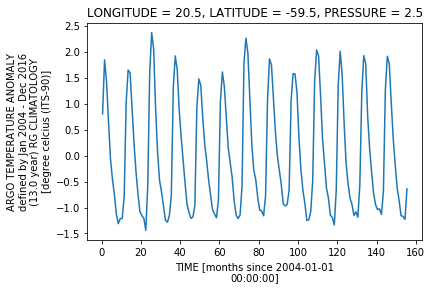

In [4]:
Tclim.ARGO_TEMPERATURE_ANOMALY.sel(PRESSURE = 0, method='nearest', LATITUDE=-60, LONGITUDE=0).plot()

In [5]:
RG_clim = xr.merge([Tclim, Sclim])

In [6]:
# Calendar type was missing, and giving errors in decoding time
RG_clim.TIME.attrs['calendar'] = '360_day'
RG_clim = xr.decode_cf(RG_clim)

In [7]:
## Add density and other things 
SA = xr.apply_ufunc(gsw.SA_from_SP, RG_clim.ARGO_SALINITY_MEAN+RG_clim.ARGO_SALINITY_ANOMALY, RG_clim.PRESSURE , 
                                    RG_clim.LONGITUDE, RG_clim.LATITUDE,
                    dask='parallelized', output_dtypes=[float,]).rename('SA')
CT = xr.apply_ufunc(gsw.CT_from_t, SA, RG_clim.ARGO_TEMPERATURE_MEAN+RG_clim.ARGO_TEMPERATURE_ANOMALY, RG_clim.PRESSURE, 
                     dask='parallelized', output_dtypes=[float,]).rename('CT')

SIGMA0 = xr.apply_ufunc(gsw.sigma0, SA, CT, dask='parallelized', output_dtypes=[float,]).rename('SIGMA0')

In [8]:
SPICE0 = xr.apply_ufunc(gsw.spiciness0, SA, CT, dask='parallelized', output_dtypes=[float,]).rename('SPICE0')

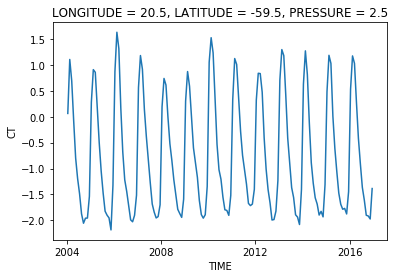

In [9]:
CT.sel(PRESSURE = 0, method='nearest', LATITUDE=-60, LONGITUDE=0).plot()

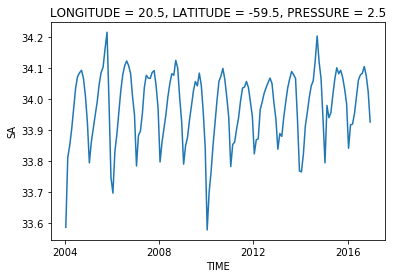

In [10]:
SA.sel(PRESSURE = 0, method='nearest', LATITUDE=-60, LONGITUDE=0).plot()

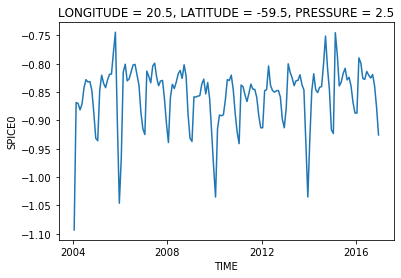

In [11]:
SPICE0.sel(PRESSURE = 0, method='nearest', LATITUDE=-60, LONGITUDE=0).plot()

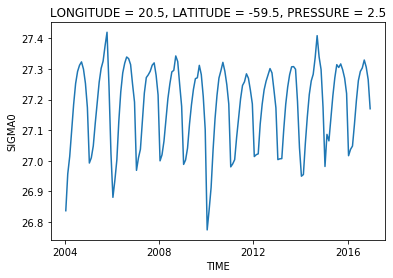

In [12]:
SIGMA0.sel(PRESSURE = 0, method='nearest', LATITUDE=-60, LONGITUDE=0).plot()

In [13]:
RG_clim = xr.merge([SPICE0, SIGMA0, SA, CT])

In [14]:
RG_clim

<xarray.Dataset>
Dimensions:    (LATITUDE: 145, LONGITUDE: 360, PRESSURE: 58, TIME: 156)
Coordinates:
  * LONGITUDE  (LONGITUDE) float32 20.5 21.5 22.5 23.5 ... 377.5 378.5 379.5
  * LATITUDE   (LATITUDE) float32 -64.5 -63.5 -62.5 -61.5 ... 77.5 78.5 79.5
  * PRESSURE   (PRESSURE) float32 2.5 10.0 20.0 30.0 ... 1800.0 1900.0 1975.0
  * TIME       (TIME) object 2004-01-16 00:00:00 ... 2016-12-16 00:00:00
Data variables:
    SPICE0     (PRESSURE, LATITUDE, LONGITUDE, TIME) float64 -0.8711 ... nan
    SIGMA0     (PRESSURE, LATITUDE, LONGITUDE, TIME) float64 27.1 27.1 ... nan
    SA         (PRESSURE, LATITUDE, LONGITUDE, TIME) float64 33.91 33.98 ... nan
    CT         (PRESSURE, LATITUDE, LONGITUDE, TIME) float64 -0.0007718 ... nan

In [15]:
T_region = (RG_clim.CT.groupby('TIME.month').mean()).sel(LATITUDE=slice(-90,-30))
S_region = (RG_clim.SA.groupby('TIME.month').mean()).sel(LATITUDE=slice(-90,-30))
rho_region = (RG_clim.SIGMA0.groupby('TIME.month').mean()).sel(LATITUDE=slice(-90,-30))
spice_region = (RG_clim.SPICE0.groupby('TIME.month').mean()).sel(LATITUDE=slice(-90,-30))

/Users/dhruvbalwada/code/miniconda/envs/sogos/lib/python3.7/site-packages/xarray/core/nanops.py:140: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


In [16]:
RG_SO = xr.merge([T_region, S_region, rho_region, spice_region])

In [17]:
RG_SO

<xarray.Dataset>
Dimensions:    (LATITUDE: 35, LONGITUDE: 360, PRESSURE: 58, month: 12)
Coordinates:
  * LONGITUDE  (LONGITUDE) float32 20.5 21.5 22.5 23.5 ... 377.5 378.5 379.5
  * LATITUDE   (LATITUDE) float32 -64.5 -63.5 -62.5 -61.5 ... -32.5 -31.5 -30.5
  * PRESSURE   (PRESSURE) float32 2.5 10.0 20.0 30.0 ... 1800.0 1900.0 1975.0
  * month      (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Data variables:
    CT         (PRESSURE, LATITUDE, LONGITUDE, month) float64 0.02461 ... nan
    SA         (PRESSURE, LATITUDE, LONGITUDE, month) float64 33.92 ... nan
    SIGMA0     (PRESSURE, LATITUDE, LONGITUDE, month) float64 27.1 27.11 ... nan
    SPICE0     (PRESSURE, LATITUDE, LONGITUDE, month) float64 -0.8662 ... nan

## Maps of SO Surface

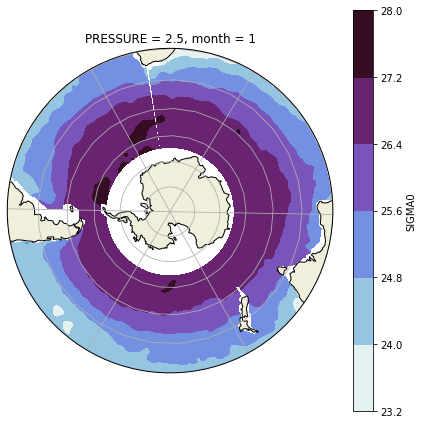

In [18]:
fig = plt.figure(figsize=(6,6))
fig.set_tight_layout(True)

ax = fig.add_subplot(1, 1, 1, projection=ccrs.SouthPolarStereo(central_longitude=29))
ax.set_extent([-180, 180, -90, -30], ccrs.PlateCarree())

# make a circular boundary (otherwise on a square)
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

# Some decoration
ax.add_feature(cfeature.LAND)
ax.coastlines()
# ax.add_feature(cfeature.OCEAN)
ax.gridlines()


RG_SO.SIGMA0.sel(month=1, PRESSURE=0, method='nearest').plot.contourf(
    ax=ax, transform=ccrs.PlateCarree(),
    cmap=cm.dense)

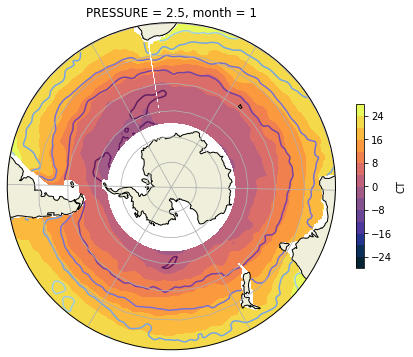

In [85]:
fig = plt.figure(figsize=(6,6))
fig.set_tight_layout(True)

ax = fig.add_subplot(1, 1, 1, projection=ccrs.SouthPolarStereo(central_longitude=29))
ax.set_extent([-180, 180, -90, -30], ccrs.PlateCarree())

# make a circular boundary (otherwise on a square)
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

# Some decoration
ax.add_feature(cfeature.LAND)
ax.coastlines()
# ax.add_feature(cfeature.OCEAN)
ax.gridlines()


RG_SO.CT.sel(month=1, PRESSURE=0, method='nearest').plot.contourf(levels=15,
    ax=ax, transform=ccrs.PlateCarree(), cbar_kwargs={"shrink": 0.4},
                                        cmap=cm.thermal)

RG_SO.SIGMA0.sel(month=1, PRESSURE=0, method='nearest').plot.contour(
    ax=ax, transform=ccrs.PlateCarree(),
    cmap=cm.dense)

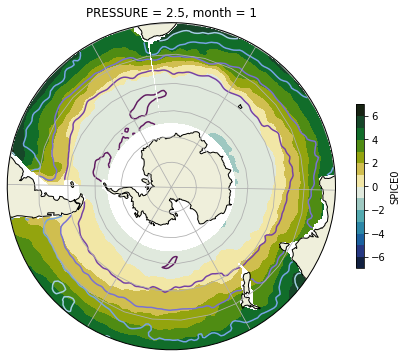

In [109]:
fig = plt.figure(figsize=(6,6))
fig.set_tight_layout(True)

ax = fig.add_subplot(1, 1, 1, projection=ccrs.SouthPolarStereo(central_longitude=29))
ax.set_extent([-180, 180, -90, -30], ccrs.PlateCarree())

# make a circular boundary (otherwise on a square)
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

# Some decoration
ax.add_feature(cfeature.LAND)
ax.coastlines()
# ax.add_feature(cfeature.OCEAN)
ax.gridlines()


RG_SO.SPICE0.sel(month=1, PRESSURE=0, method='nearest').plot.contourf(levels=15,
    ax=ax, transform=ccrs.PlateCarree(), cbar_kwargs={"shrink": 0.4},
                                        cmap=cm.delta)

RG_SO.SIGMA0.sel(month=1, PRESSURE=0, method='nearest').plot.contour(
    ax=ax, transform=ccrs.PlateCarree(),
    cmap=cm.dense)

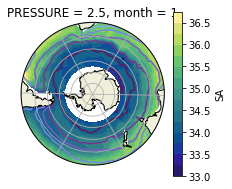

In [54]:
fig = plt.figure(figsize=(6,6))
fig.set_tight_layout(True)

ax = fig.add_subplot(1, 2, 1, projection=ccrs.SouthPolarStereo(central_longitude=29))
ax.set_extent([-180, 180, -90, -30], ccrs.PlateCarree())

# make a circular boundary (otherwise on a square)
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

# Some decoration
ax.add_feature(cfeature.LAND)
ax.coastlines()
# ax.add_feature(cfeature.OCEAN)
ax.gridlines()


RG_SO.SA.sel(month=1, PRESSURE=0, method='nearest').plot.contourf(levels=15,
    ax=ax, transform=ccrs.PlateCarree(), cbar_kwargs={"shrink": 0.4},
                                cmap=cm.haline)

RG_SO.SIGMA0.sel(month=1, PRESSURE=0, method='nearest').plot.contour(
    ax=ax, transform=ccrs.PlateCarree(), cmap=cm.dense)

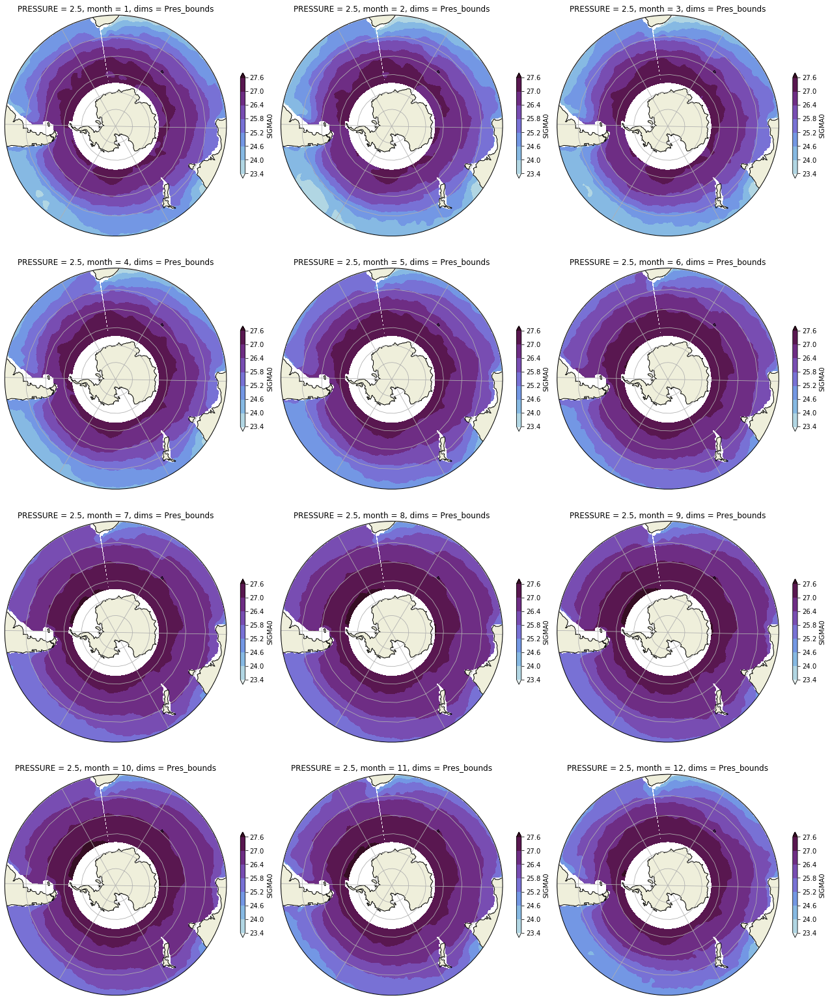

In [481]:
fig = plt.figure(figsize=(6*3,6*4))
fig.set_tight_layout(True)

for i in range(1,13):
    ax = fig.add_subplot(4, 3, i, projection=ccrs.SouthPolarStereo(central_longitude=29))
    ax.set_extent([-180, 180, -90, -30], ccrs.PlateCarree())
    
    # make a circular boundary (otherwise on a square)
    theta = np.linspace(0, 2 * np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)

    # Some decoration
    ax.add_feature(cfeature.LAND)
    ax.coastlines()
    # ax.add_feature(cfeature.OCEAN)
    ax.gridlines()


    #RG_SO.CT.sel(month=i, PRESSURE=0, method='nearest').plot.contourf(levels=np.linspace(-3,25,15), vmin=-3, vmax=25,
    #    ax=ax, transform=ccrs.PlateCarree(), cbar_kwargs={"shrink": 0.3},
    #                                cmap=cm.thermal)

    RG_SO.SIGMA0.sel(month=i, PRESSURE=0, method='nearest').plot.contourf(levels=8, vmin=23.4, vmax=27.6,
        ax=ax, transform=ccrs.PlateCarree(), cmap=cm.dense, cbar_kwargs={"shrink": 0.3}, extend='both')
    
plt.savefig('../figures/SSD.pdf')

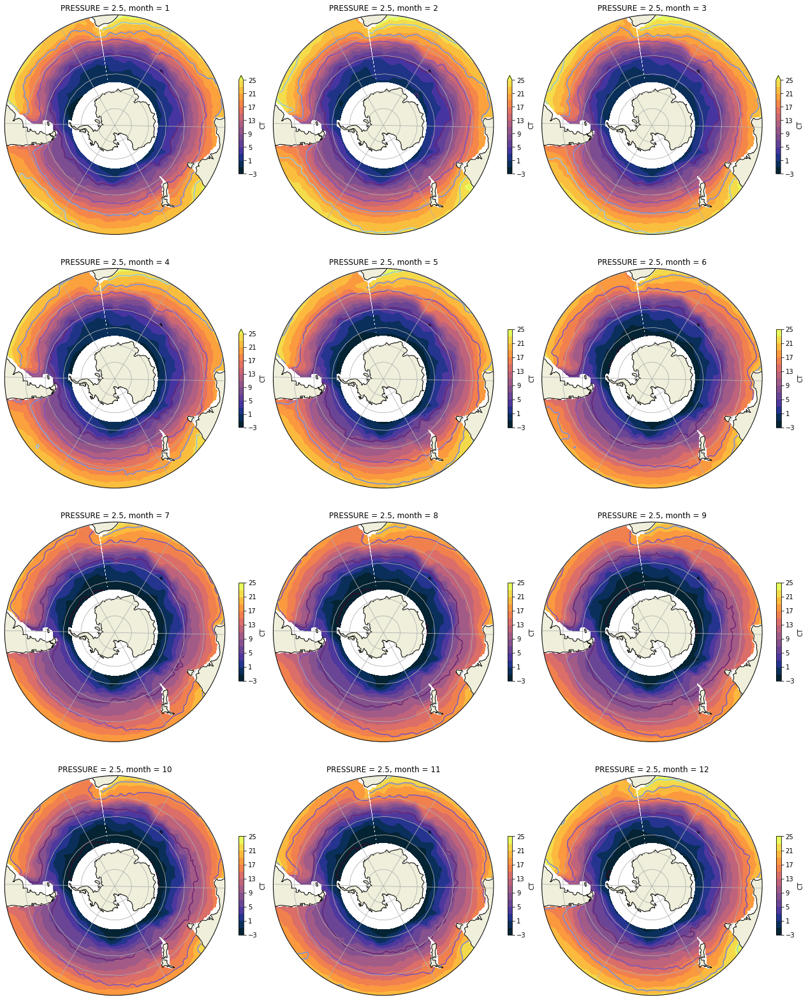

In [93]:
fig = plt.figure(figsize=(6*3,6*4))
fig.set_tight_layout(True)

for i in range(1,13):
    ax = fig.add_subplot(4, 3, i, projection=ccrs.SouthPolarStereo(central_longitude=29))
    ax.set_extent([-180, 180, -90, -30], ccrs.PlateCarree())
    
    # make a circular boundary (otherwise on a square)
    theta = np.linspace(0, 2 * np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)

    # Some decoration
    ax.add_feature(cfeature.LAND)
    ax.coastlines()
    # ax.add_feature(cfeature.OCEAN)
    ax.gridlines()


    RG_SO.CT.sel(month=i, PRESSURE=0, method='nearest').plot.contourf(levels=np.linspace(-3,25,15), vmin=-3, vmax=25,
        ax=ax, transform=ccrs.PlateCarree(), cbar_kwargs={"shrink": 0.3},
                                    cmap=cm.thermal)

    RG_SO.SIGMA0.sel(month=i, PRESSURE=0, method='nearest').plot.contour(levels=np.linspace(23.4,27.6,6), vmin=23.4, vmax=27.6,
        ax=ax, transform=ccrs.PlateCarree(), cmap=cm.dense)
    
plt.savefig('../figures/SST.pdf')

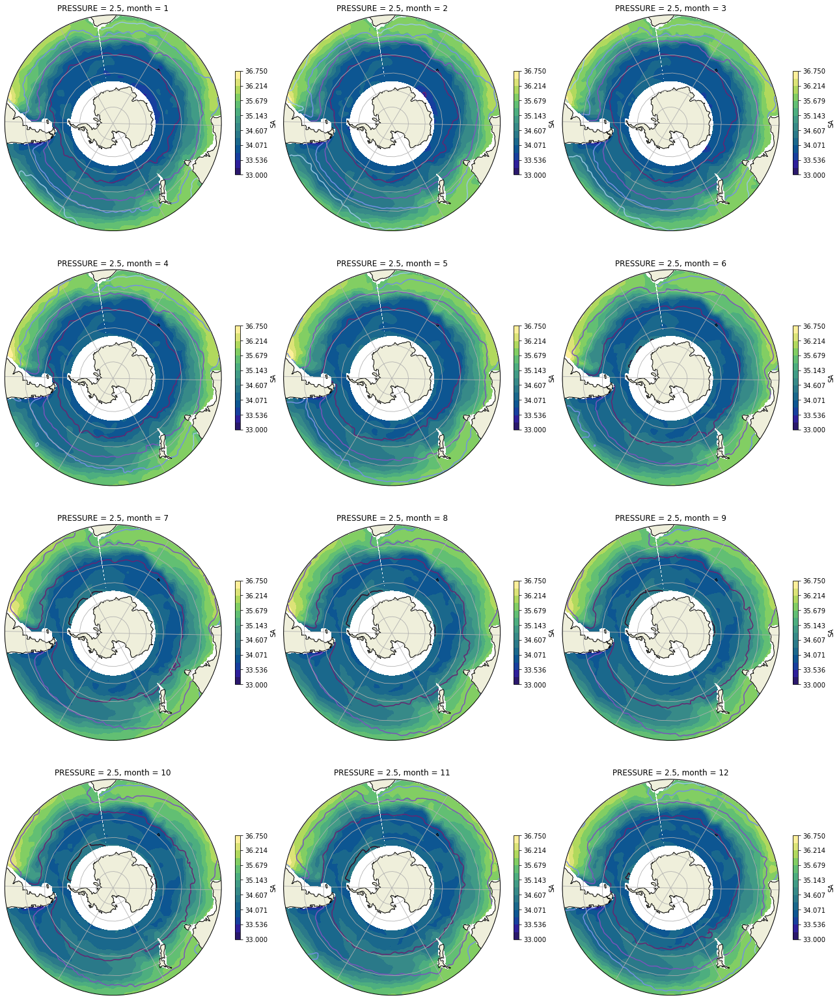

In [94]:
fig = plt.figure(figsize=(6*3,6*4))
fig.set_tight_layout(True)

for i in range(1,13):
    ax = fig.add_subplot(4, 3, i, projection=ccrs.SouthPolarStereo(central_longitude=29))
    ax.set_extent([-180, 180, -90, -30], ccrs.PlateCarree())
    
    # make a circular boundary (otherwise on a square)
    theta = np.linspace(0, 2 * np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)

    # Some decoration
    ax.add_feature(cfeature.LAND)
    ax.coastlines()
    # ax.add_feature(cfeature.OCEAN)
    ax.gridlines()


    RG_SO.SA.sel(month=i, PRESSURE=0, method='nearest').plot.contourf(levels=np.linspace(33,36.75,15), vmin=33, vmax=36.75,
        ax=ax, transform=ccrs.PlateCarree(), cbar_kwargs={"shrink": 0.3},
                                    cmap=cm.haline)

    RG_SO.SIGMA0.sel(month=i, PRESSURE=0, method='nearest').plot.contour(levels=np.linspace(23.4,27.6,6), vmin=23.4, vmax=27.6,
        ax=ax, transform=ccrs.PlateCarree(), cmap=cm.dense)
    
plt.savefig('../figures/SSS.pdf')

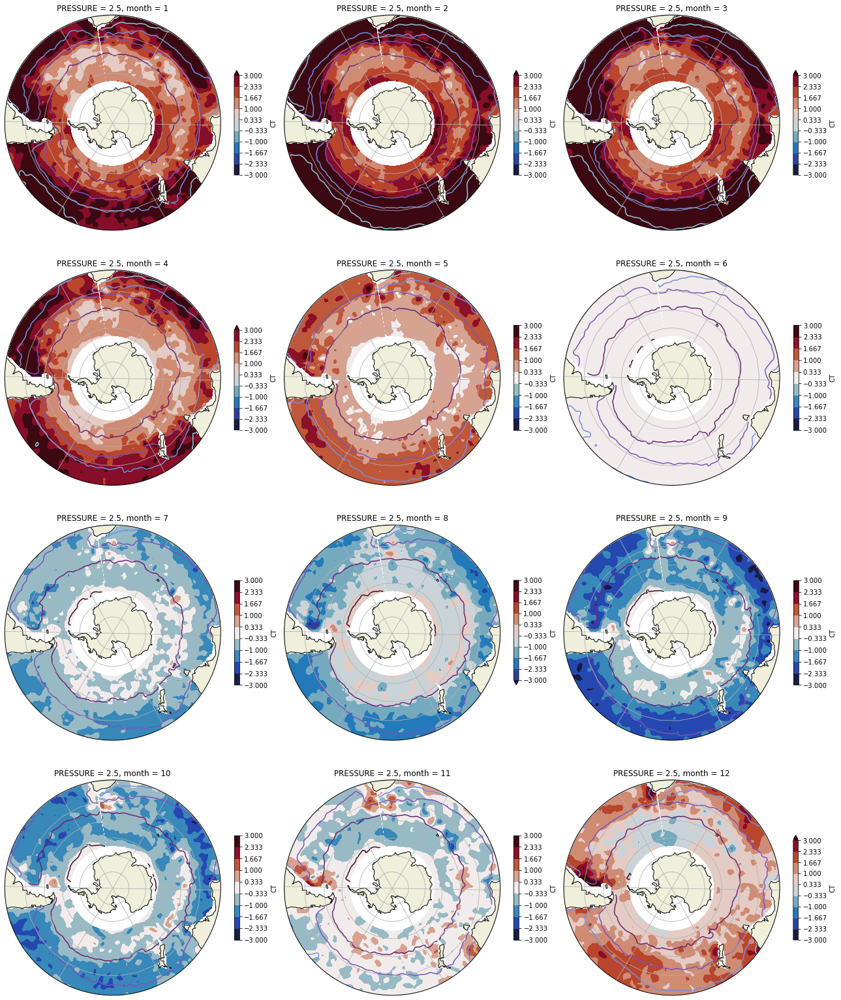

In [98]:
fig = plt.figure(figsize=(6*3,6*4))
fig.set_tight_layout(True)

for i in range(1,13):
    ax = fig.add_subplot(4, 3, i, projection=ccrs.SouthPolarStereo(central_longitude=29))
    ax.set_extent([-180, 180, -90, -30], ccrs.PlateCarree())
    
    # make a circular boundary (otherwise on a square)
    theta = np.linspace(0, 2 * np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)

    # Some decoration
    ax.add_feature(cfeature.LAND)
    ax.coastlines()
    # ax.add_feature(cfeature.OCEAN)
    ax.gridlines()


    (RG_SO.CT.sel(month=i, PRESSURE=0, method='nearest') - 
     RG_SO.CT.sel(month=6, PRESSURE=0, method='nearest')).plot.contourf(levels=np.linspace(-3,3,10), vmin=-3, vmax=3,
        ax=ax, transform=ccrs.PlateCarree(), cbar_kwargs={"shrink": 0.3},
                                    cmap=cm.balance)

    RG_SO.SIGMA0.sel(month=i, PRESSURE=0, method='nearest').plot.contour(levels=np.linspace(23.4,27.6,6), vmin=23.4, vmax=27.6,
        ax=ax, transform=ccrs.PlateCarree(), cmap=cm.dense)
    
plt.savefig('../figures/SST_anomaly.pdf')

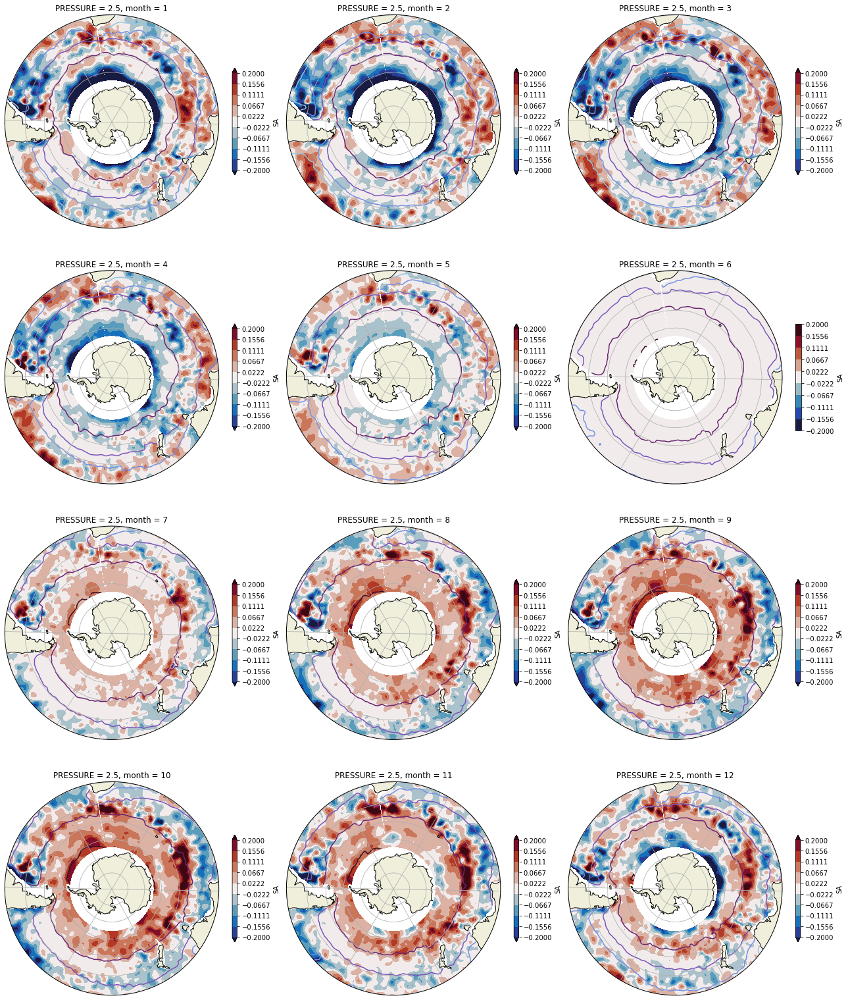

In [96]:
fig = plt.figure(figsize=(6*3,6*4))
fig.set_tight_layout(True)

for i in range(1,13):
    ax = fig.add_subplot(4, 3, i, projection=ccrs.SouthPolarStereo(central_longitude=29))
    ax.set_extent([-180, 180, -90, -30], ccrs.PlateCarree())
    
    # make a circular boundary (otherwise on a square)
    theta = np.linspace(0, 2 * np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)

    # Some decoration
    ax.add_feature(cfeature.LAND)
    ax.coastlines()
    # ax.add_feature(cfeature.OCEAN)
    ax.gridlines()


    (RG_SO.SA.sel(month=i, PRESSURE=0, method='nearest') - 
     RG_SO.SA.sel(month=6, PRESSURE=0, method='nearest')).plot.contourf(levels=np.linspace(-.2,.2,10), vmin=-.2, vmax=.2,
        ax=ax, transform=ccrs.PlateCarree(), cbar_kwargs={"shrink": 0.3},
                                    cmap=cm.balance)

    RG_SO.SIGMA0.sel(month=i, PRESSURE=0, method='nearest').plot.contour(levels=np.linspace(23.4,27.6,6), vmin=23.4, vmax=27.6,
        ax=ax, transform=ccrs.PlateCarree(), cmap=cm.dense)
    
plt.savefig('../figures/SSS_anomaly.pdf')

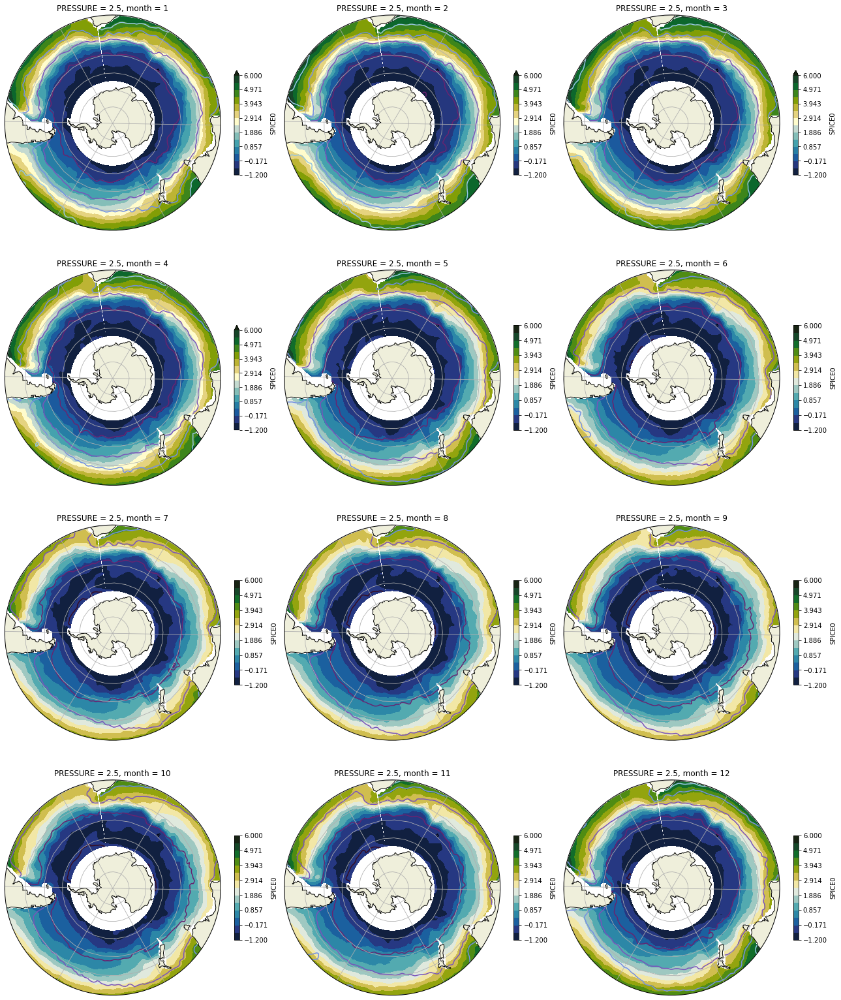

In [113]:
fig = plt.figure(figsize=(6*3,6*4))
fig.set_tight_layout(True)

for i in range(1,13):
    ax = fig.add_subplot(4, 3, i, projection=ccrs.SouthPolarStereo(central_longitude=29))
    ax.set_extent([-180, 180, -90, -30], ccrs.PlateCarree())
    
    # make a circular boundary (otherwise on a square)
    theta = np.linspace(0, 2 * np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)

    # Some decoration
    ax.add_feature(cfeature.LAND)
    ax.coastlines()
    # ax.add_feature(cfeature.OCEAN)
    ax.gridlines()


    RG_SO.SPICE0.sel(month=i, PRESSURE=0, method='nearest').plot.contourf(levels=np.linspace(-1.2,6,15), vmin=-1.2, vmax=6,
        ax=ax, transform=ccrs.PlateCarree(), cbar_kwargs={"shrink": 0.3},
                                    cmap=cm.delta)

    RG_SO.SIGMA0.sel(month=i, PRESSURE=0, method='nearest').plot.contour(levels=np.linspace(23.4,27.6,6), vmin=23.4, vmax=27.6,
        ax=ax, transform=ccrs.PlateCarree(), cmap=cm.dense)
    
plt.savefig('../figures/Spice.pdf')

## Explore Spice/Density more

In [119]:
[SA_grid, CT_grid]  = np.meshgrid(np.linspace(32.5, 36.8, 50), np.linspace(-3, 25,50))


In [122]:
Sigma0_grid = gsw.sigma0(SA_grid, CT_grid)
Spice0_grid = gsw.spiciness0(SA_grid, CT_grid)

<a list of 5 text.Text objects>

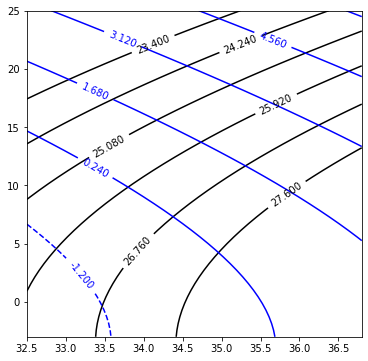

In [136]:
fig, ax = plt.subplots(figsize=(6,6))

CS1 = ax.contour(SA_grid, CT_grid, Sigma0_grid, colors='k',#cmap=cm.dense,
                 levels=np.linspace(23.4,27.6,6), vmin=23.4, vmax=27.6);

CS2 = ax.contour(SA_grid, CT_grid, Spice0_grid, colors='b',#cmap=cm.delta,
           levels=np.linspace(-1.2,6,6), vmin=-1.2, vmax=6)


ax.clabel(CS1 , inline=1, fontsize=10)
ax.clabel(CS2 , inline=1, fontsize=10)

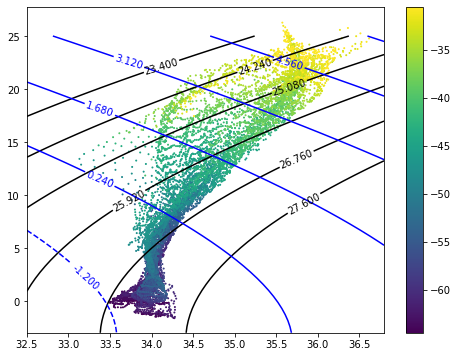

In [148]:
fig, ax = plt.subplots(figsize=(8,6))

CS1 = ax.contour(SA_grid, CT_grid, Sigma0_grid, colors='k',#cmap=cm.dense,
                 levels=np.linspace(23.4,27.6,6), vmin=23.4, vmax=27.6);

CS2 = ax.contour(SA_grid, CT_grid, Spice0_grid, colors='b',#cmap=cm.delta,
           levels=np.linspace(-1.2,6,6), vmin=-1.2, vmax=6)


ax.clabel(CS1 , inline=1, fontsize=10)
ax.clabel(CS2 , inline=1, fontsize=10)

plt.scatter(RG_SO.SA.sel(PRESSURE=0, method='nearest', month=1),
            RG_SO.CT.sel(PRESSURE=0, method='nearest', month=1), 
            c=(RG_SO.LATITUDE + RG_SO.SA*0).sel(PRESSURE=0, method='nearest', month=1),
            s=1)
plt.colorbar()

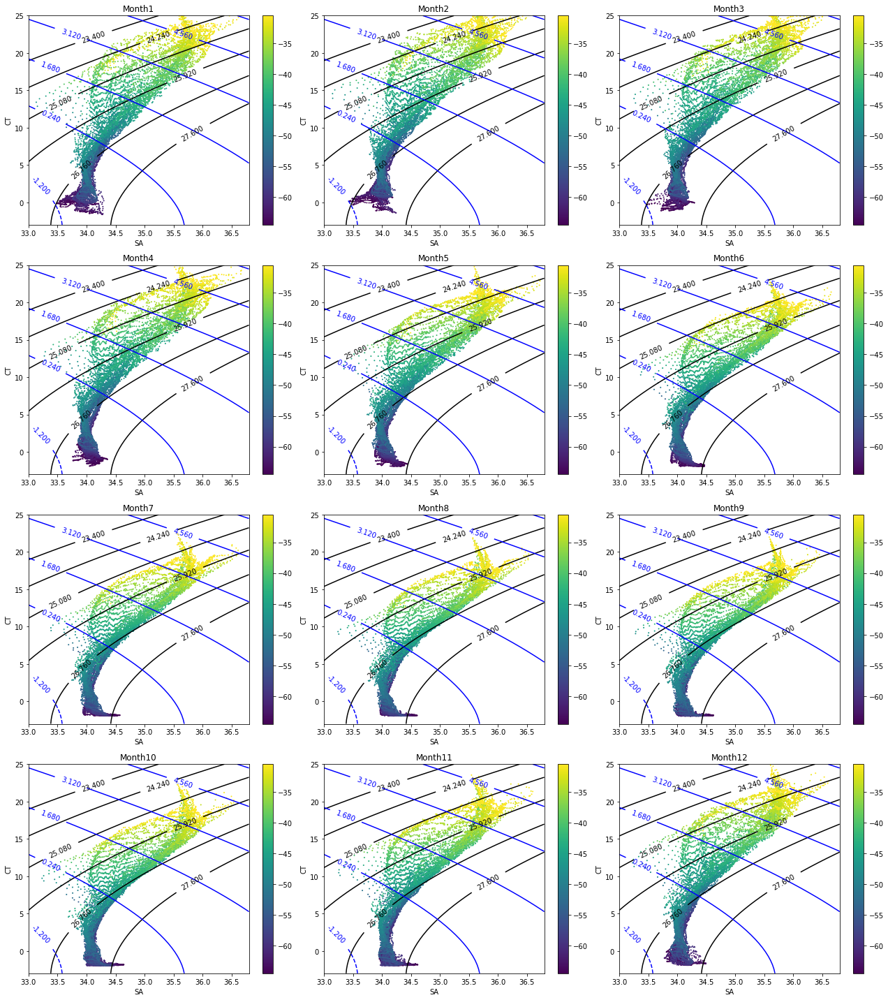

In [156]:
fig = plt.figure(figsize=(6*3, 5*4))
fig.set_tight_layout(True)

for i in range(1,13):
    ax = fig.add_subplot(4, 3, i)
    
    
    CS1 = ax.contour(SA_grid, CT_grid, Sigma0_grid, colors='k',#cmap=cm.dense,
                 levels=np.linspace(23.4,27.6,6), vmin=23.4, vmax=27.6);

    CS2 = ax.contour(SA_grid, CT_grid, Spice0_grid, colors='b',#cmap=cm.delta,
               levels=np.linspace(-1.2,6,6), vmin=-1.2, vmax=6)

    ax.clabel(CS1 , inline=1, fontsize=10)
    ax.clabel(CS2 , inline=1, fontsize=10)

    plt.scatter(RG_SO.SA.sel(PRESSURE=0, method='nearest', month=i),
                RG_SO.CT.sel(PRESSURE=0, method='nearest', month=i), 
                c=(RG_SO.LATITUDE + RG_SO.SA*0).sel(PRESSURE=0, method='nearest', month=i),
                s=1)
    plt.colorbar()
    
    plt.xlim([33, 36.8])
    plt.ylim([-3,25])
    
    plt.xlabel('SA')
    plt.ylabel('CT')
    
    plt.title('Month'+str(i))
plt.savefig('../figures/TS.png')    



## Mixed layer depths and N2 at base of ML

In [19]:
RG_SO = generate_grid_ds(RG_SO, 
                         {'Z':'PRESSURE', 
                          'X':'LONGITUDE', 
                          'Y':'LATITUDE', 'T':'month'})

In [20]:
grid = Grid(RG_SO, periodic=['X','T'])
grid

<xgcm.Grid>
Y Axis (not periodic):
  * center   LATITUDE --> left
  * left     LATITUDE_left --> center
X Axis (periodic):
  * center   LONGITUDE --> left
  * left     LONGITUDE_left --> center
Z Axis (not periodic):
  * center   PRESSURE --> left
  * left     PRESSURE_left --> center
T Axis (periodic):
  * center   month --> left
  * left     month_left --> center

In [21]:
g = 9.81
rho0 = 1000

In [22]:
N2_clim_monthly = grid.interp(-g/rho0* 
                 grid.diff(RG_SO.SIGMA0, 'Z', boundary='extend')
                  / -(grid.diff(RG_SO.PRESSURE, 'Z', boundary='extend')), 
                  'Z', boundary='extend')

In [23]:
N2_clim_monthly.coords

Coordinates:
  * PRESSURE   (PRESSURE) float32 2.5 10.0 20.0 30.0 ... 1800.0 1900.0 1975.0
  * LATITUDE   (LATITUDE) float32 -64.5 -63.5 -62.5 -61.5 ... -32.5 -31.5 -30.5
  * LONGITUDE  (LONGITUDE) float32 20.5 21.5 22.5 23.5 ... 377.5 378.5 379.5
  * month      (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

In [24]:
delta_dens = RG_SO.SIGMA0 - RG_SO.SIGMA0.isel(PRESSURE=0)

In [26]:
temp = delta_dens.where(delta_dens>=0.05) # just use a simple density criterion
MLD = temp.PRESSURE.where(temp == temp.min('PRESSURE')).min('PRESSURE')

MLD_clim = temp.PRESSURE.where(temp == temp.min('PRESSURE')).min('PRESSURE')

/Users/dhruvbalwada/code/miniconda/envs/sogos/lib/python3.7/site-packages/xarray/core/nputils.py:223: RuntimeWarning: All-NaN slice encountered
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
/Users/dhruvbalwada/code/miniconda/envs/sogos/lib/python3.7/site-packages/xarray/core/nputils.py:223: RuntimeWarning: All-NaN slice encountered
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)


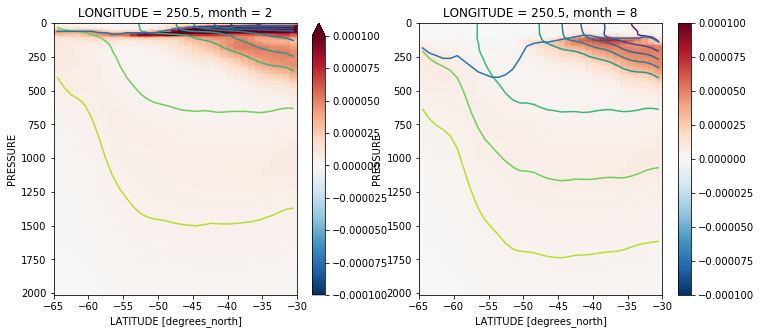

In [27]:
plt.figure(figsize=(12,5))

plt.subplot(121)
n=2
N2_clim_monthly.sel(LONGITUDE=250, month=n, method='nearest').plot(
            vmin=-1e-4, cmap='RdBu_r')
RG_SO.SIGMA0.sel(LONGITUDE=250, month=n, method='nearest').plot.contour(
            levels=10)

MLD_clim.sel(LONGITUDE=250, month=n, method='nearest').plot()

plt.gca().invert_yaxis()

plt.subplot(122)
n=8
N2_clim_monthly.sel(LONGITUDE=250, month=n, method='nearest').plot(
            vmin=-1e-4, cmap='RdBu_r')
RG_SO.SIGMA0.sel(LONGITUDE=250, month=n, method='nearest').plot.contour(
            levels=10)

MLD_clim.sel(LONGITUDE=250, month=n, method='nearest').plot()

plt.gca().invert_yaxis()

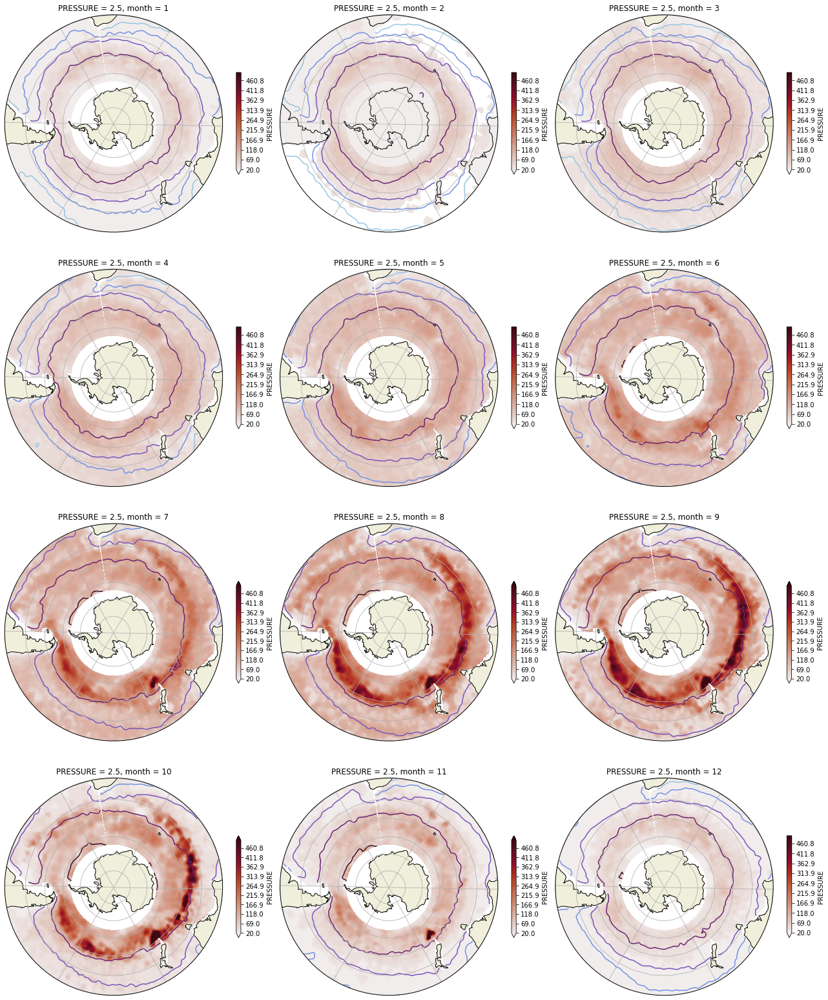

In [180]:
fig = plt.figure(figsize=(6*3,6*4))
fig.set_tight_layout(True)

for i in range(1,13):
    ax = fig.add_subplot(4, 3, i, projection=ccrs.SouthPolarStereo(central_longitude=29))
    ax.set_extent([-180, 180, -90, -30], ccrs.PlateCarree())
    
    # make a circular boundary (otherwise on a square)
    theta = np.linspace(0, 2 * np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)

    # Some decoration
    ax.add_feature(cfeature.LAND)
    ax.coastlines()
    # ax.add_feature(cfeature.OCEAN)
    ax.gridlines()


    MLD_clim.sel(month=i, method='nearest').plot.contourf(levels=np.linspace(20,500),vmin=20, vmax=500,
        ax=ax, transform=ccrs.PlateCarree(), cbar_kwargs={"shrink": 0.3},
                                    cmap=cm.amp)

    RG_SO.SIGMA0.sel(month=i, PRESSURE=0, method='nearest').plot.contour(levels=np.linspace(23.4,27.6,6), vmin=23.4, vmax=27.6,
        ax=ax, transform=ccrs.PlateCarree(), cmap=cm.dense)
    
plt.savefig('../figures/MLD.pdf')

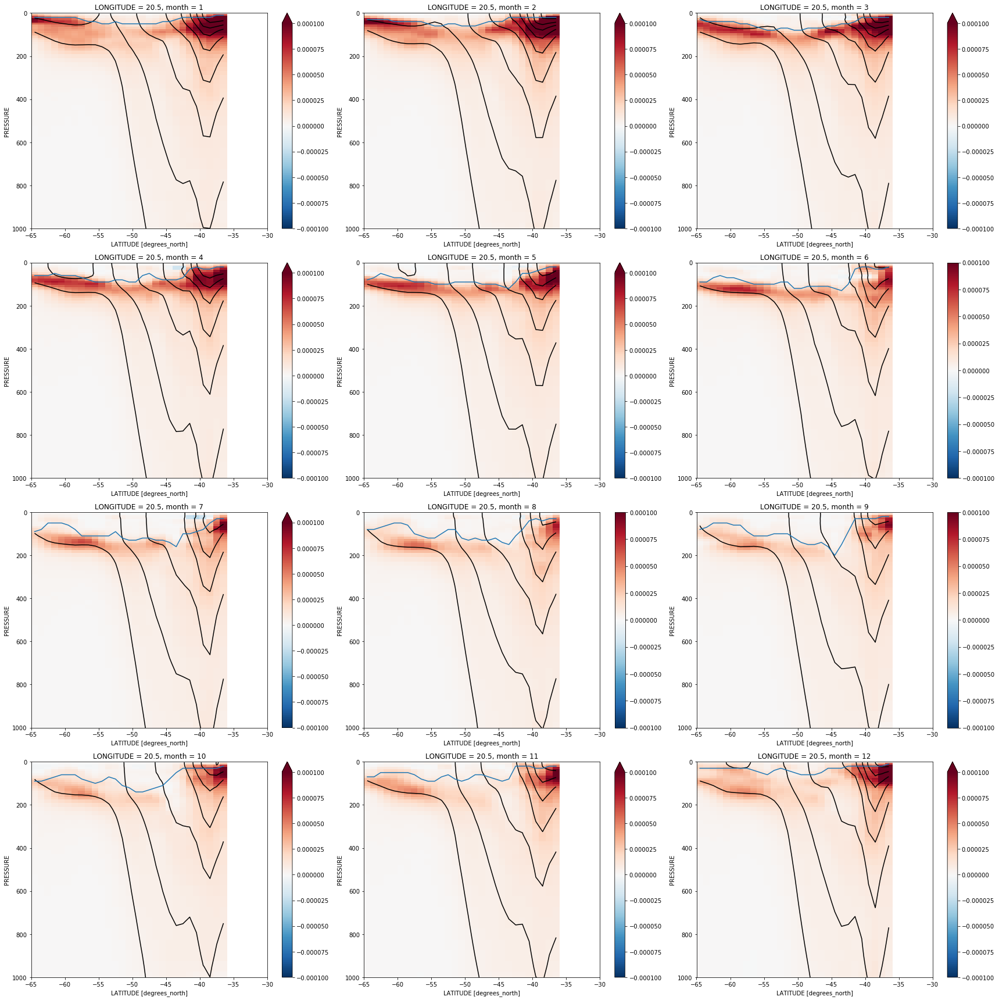

In [201]:
fig = plt.figure(figsize=(8*3,6*4))
fig.set_tight_layout(True)

lat = 0;

for i in range(1,13):
    ax = fig.add_subplot(4, 3, i)
    
    N2_clim_monthly.sel(LONGITUDE=lat, month=i, method='nearest').plot(ax=ax,
            vmin=-1e-4, cmap='RdBu_r')
    
    RG_SO.SIGMA0.sel(LONGITUDE=lat, month=i, method='nearest').plot.contour(ax=ax,
            levels=np.linspace(24,27.6,10), colors='k')
    
    MLD_clim.sel(LONGITUDE=lat, month=i, method='nearest').plot(ax=ax)

    ax.invert_yaxis()
    
    ax.set_ylim([1000,0])

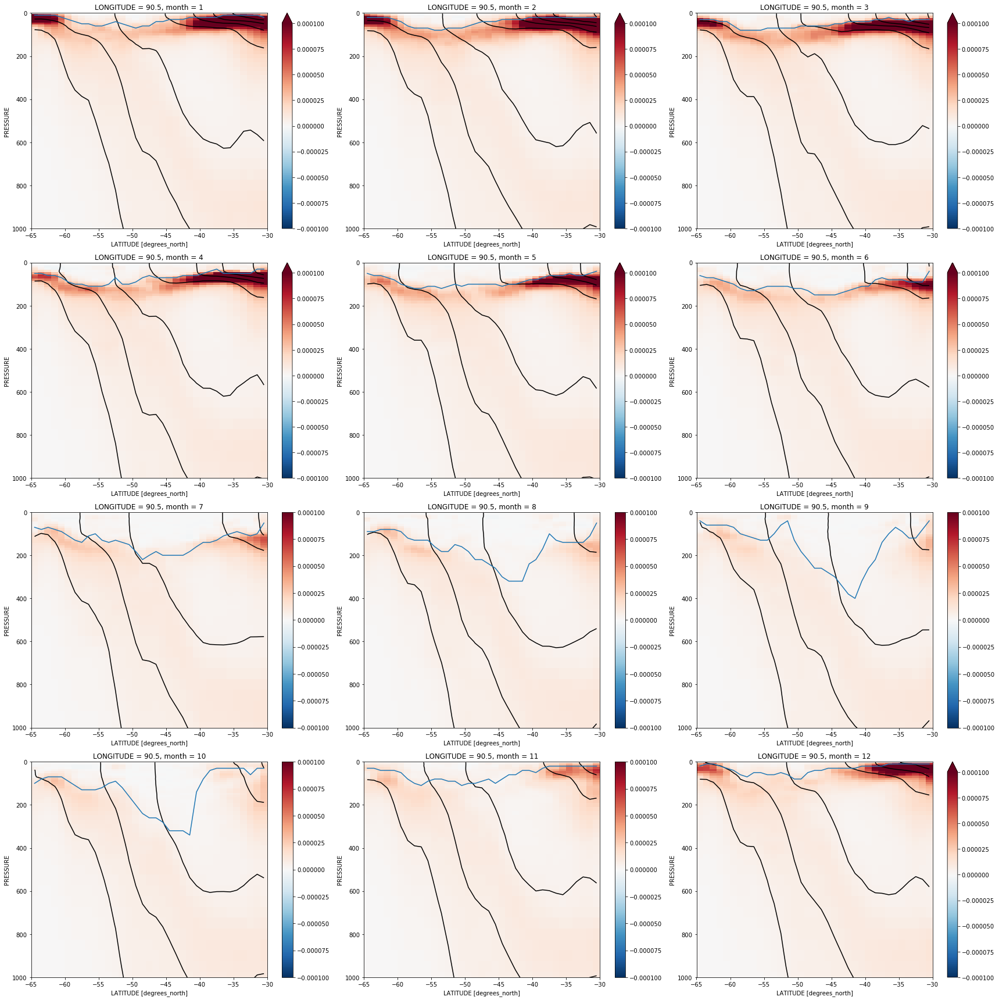

In [200]:
fig = plt.figure(figsize=(8*3,6*4))
fig.set_tight_layout(True)

lat = 90;

for i in range(1,13):
    ax = fig.add_subplot(4, 3, i)
    
    N2_clim_monthly.sel(LONGITUDE=lat, month=i, method='nearest').plot(ax=ax,
            vmin=-1e-4, cmap='RdBu_r')
    
    RG_SO.SIGMA0.sel(LONGITUDE=lat, month=i, method='nearest').plot.contour(ax=ax,
            levels=np.linspace(24,27.6,10), colors='k')
    
    MLD_clim.sel(LONGITUDE=lat, month=i, method='nearest').plot(ax=ax)

    ax.invert_yaxis()
    
    ax.set_ylim([1000,0])

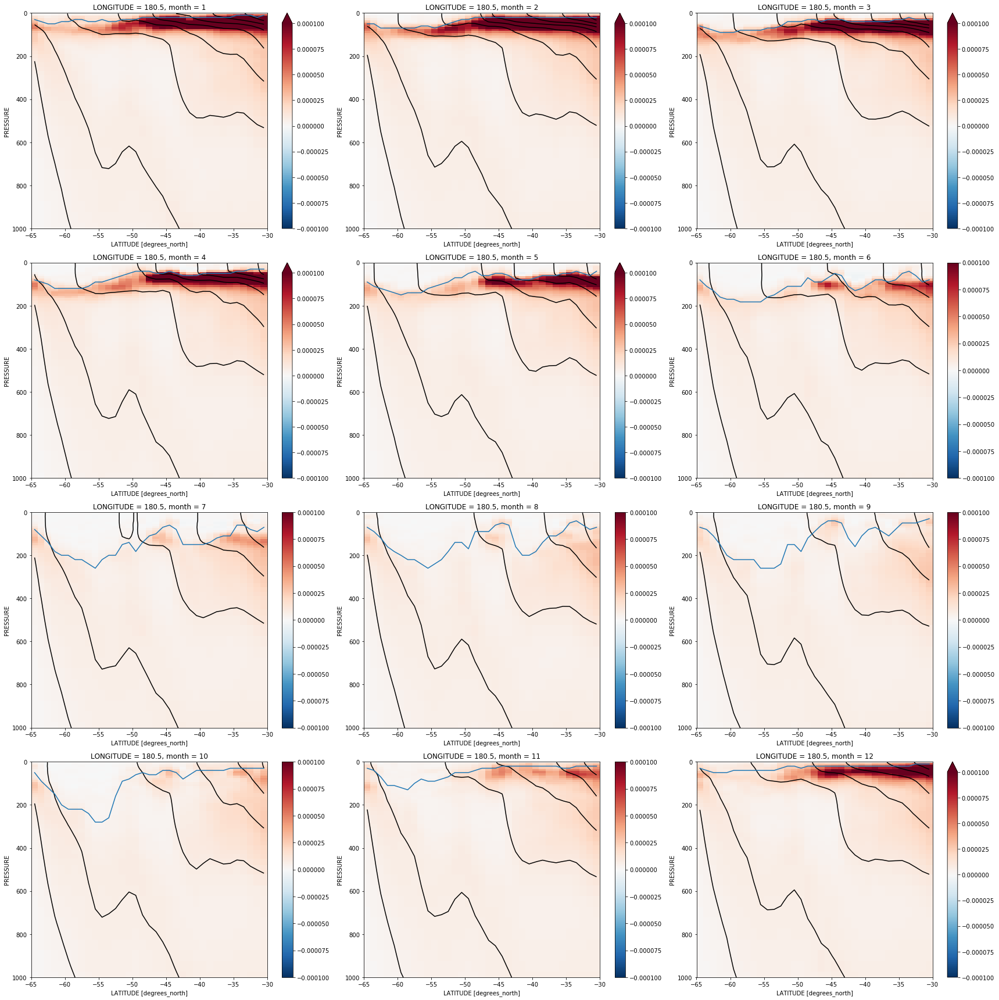

In [202]:
fig = plt.figure(figsize=(8*3,6*4))
fig.set_tight_layout(True)

lat = 180;

for i in range(1,13):
    ax = fig.add_subplot(4, 3, i)
    
    N2_clim_monthly.sel(LONGITUDE=lat, month=i, method='nearest').plot(ax=ax,
            vmin=-1e-4, cmap='RdBu_r')
    
    RG_SO.SIGMA0.sel(LONGITUDE=lat, month=i, method='nearest').plot.contour(ax=ax,
            levels=np.linspace(24,27.6,10), colors='k')
    
    MLD_clim.sel(LONGITUDE=lat, month=i, method='nearest').plot(ax=ax)

    ax.invert_yaxis()
    
    ax.set_ylim([1000,0])

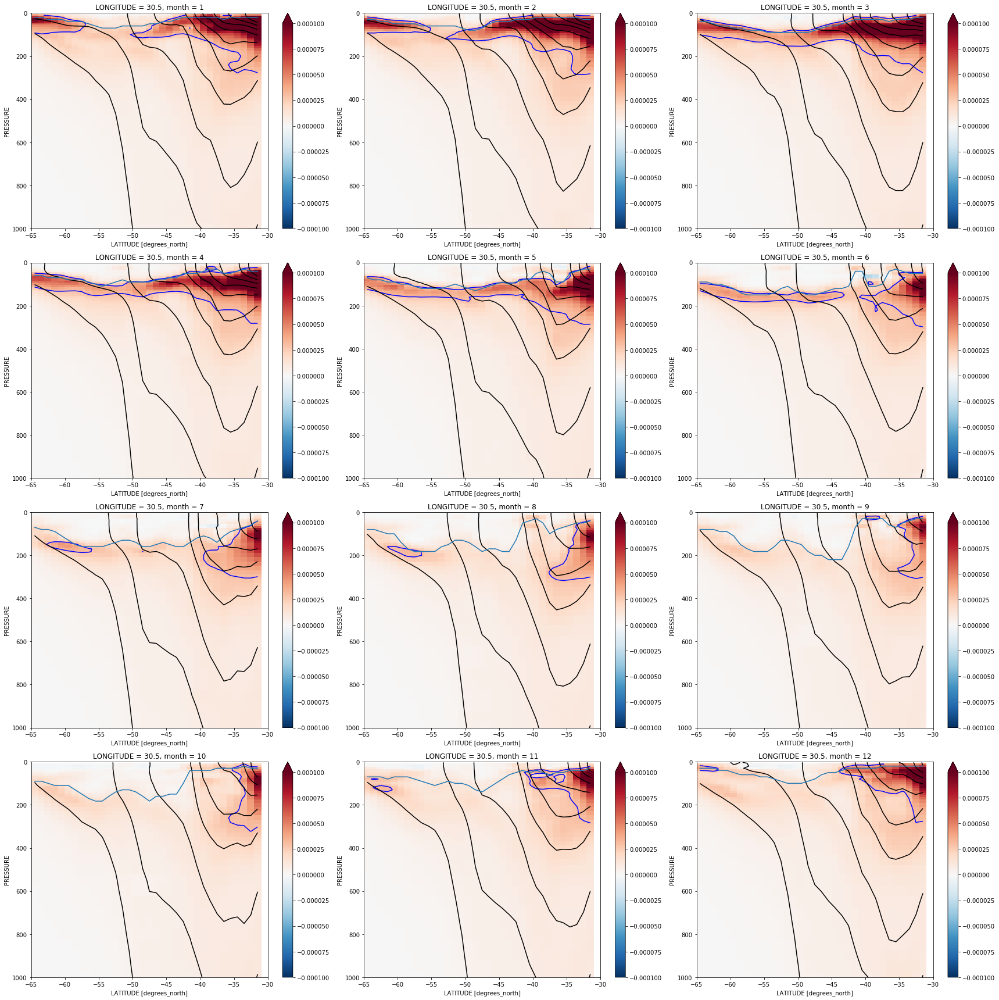

In [28]:
fig = plt.figure(figsize=(8*3,6*4))
fig.set_tight_layout(True)

lat = 30;

for i in range(1,13):
    ax = fig.add_subplot(4, 3, i)
    
    N2_clim_monthly.sel(LONGITUDE=lat, month=i, method='nearest').plot(ax=ax,
            vmin=-1e-4, cmap='RdBu_r')
    N2_clim_monthly.sel(LONGITUDE=lat, month=i, method='nearest').plot.contour(
         levels=[3e-5], ax=ax, colors='b')
    
    RG_SO.SIGMA0.sel(LONGITUDE=lat, month=i, method='nearest').plot.contour(ax=ax,
            levels=np.linspace(24,27.6,10), colors='k')
    
    MLD_clim.sel(LONGITUDE=lat, month=i, method='nearest').plot(ax=ax)

    ax.invert_yaxis()
    
    ax.set_ylim([1000,0])

In [30]:
Pressure_test = N2_clim_monthly.PRESSURE+ N2_clim_monthly*0

In [31]:
depth_sel = np.logical_and(Pressure_test>MLD_clim, Pressure_test<MLD_clim+50)

In [32]:
# average N2 at the base of the ML 
N2_base = N2_clim_monthly.where(depth_sel, drop=True).mean('PRESSURE')

/Users/dhruvbalwada/code/miniconda/envs/sogos/lib/python3.7/site-packages/xarray/core/nanops.py:140: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


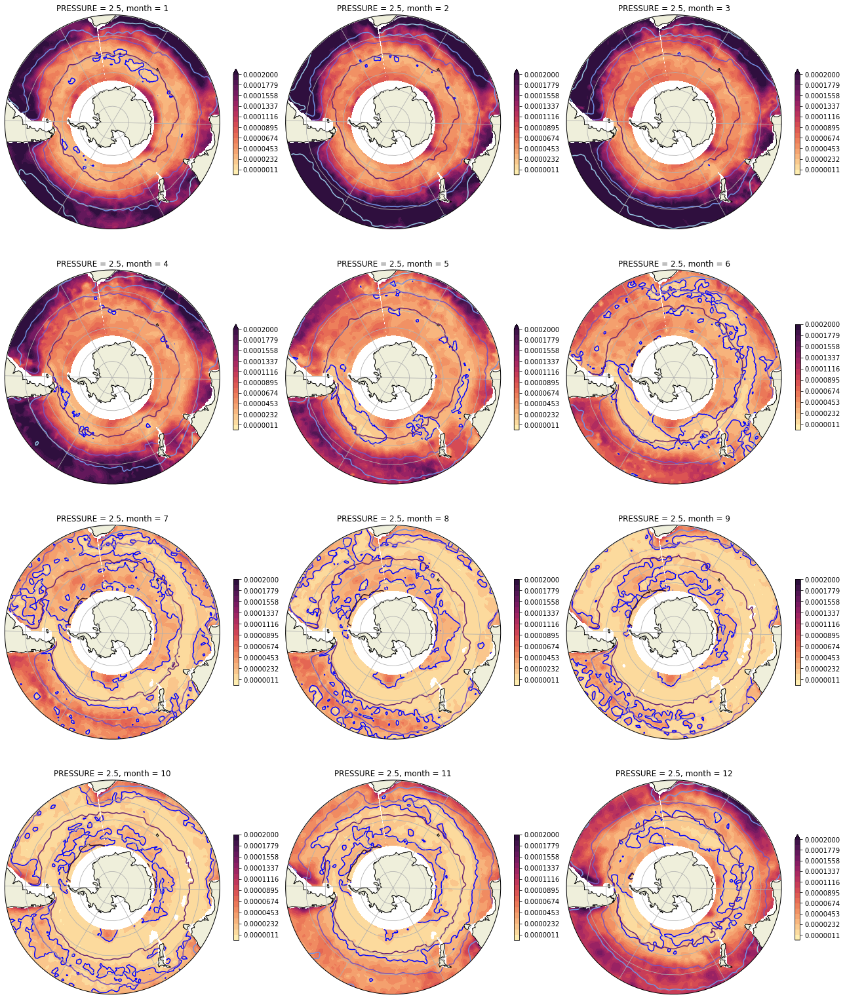

In [256]:
fig = plt.figure(figsize=(6*3,6*4))
fig.set_tight_layout(True)

for i in range(1,13):
    ax = fig.add_subplot(4, 3, i, projection=ccrs.SouthPolarStereo(central_longitude=29))
    ax.set_extent([-180, 180, -90, -30], ccrs.PlateCarree())
    
    # make a circular boundary (otherwise on a square)
    theta = np.linspace(0, 2 * np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)

    # Some decoration
    ax.add_feature(cfeature.LAND)
    ax.coastlines()
    # ax.add_feature(cfeature.OCEAN)
    ax.gridlines()


    N2_base.sel(month=i, method='nearest').plot.contourf(levels=np.linspace(-1e-5, 2e-4,20), 
                                                         vmin=0, vmax=2e-4, 
                    ax=ax, transform=ccrs.PlateCarree(), cbar_kwargs={"shrink": 0.3},
                                    cmap=cm.matter)
    N2_base.sel(month=i, method='nearest').plot.contour(levels=[2e-5], 
                    ax=ax, transform=ccrs.PlateCarree(), 
                                    colors='b')
    
    RG_SO.SIGMA0.sel(month=i, PRESSURE=0, method='nearest').plot.contour(
        levels=np.linspace(23.4,27.6,6), vmin=23.4, vmax=27.6,
        ax=ax, transform=ccrs.PlateCarree(), cmap=cm.dense)
    
plt.savefig('../figures/N2_MLD_base.pdf')

Probably better to look at the along isopycnal change in PV, rather than only at N2 at the base of the ML. The above approach requires an arbitrary choice of N2 that we consider as eroded.

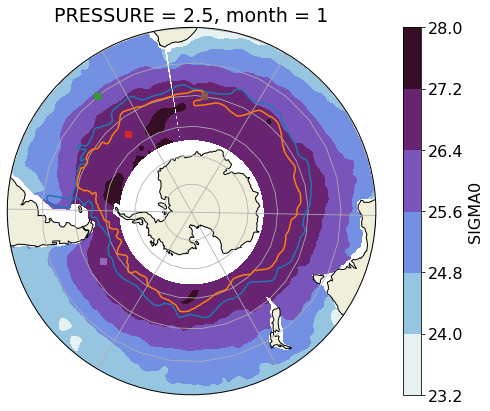

In [87]:
fig = plt.figure(figsize=(8,6))
fig.set_tight_layout(True)

ax = fig.add_subplot(1, 1, 1, projection=ccrs.SouthPolarStereo(central_longitude=29))
ax.set_extent([-180, 180, -90, -30], ccrs.PlateCarree())

# make a circular boundary (otherwise on a square)
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

# Some decoration
ax.add_feature(cfeature.LAND)
ax.coastlines()
# ax.add_feature(cfeature.OCEAN)
ax.gridlines()


RG_SO.SIGMA0.sel(month=1, PRESSURE=0, method='nearest').plot.contourf(
    ax=ax, transform=ccrs.PlateCarree(),
    cmap=cm.dense)

ax.plot(saf.lon, saf.lat, transform=ccrs.PlateCarree())
ax.plot(pf.lon, pf.lat, transform=ccrs.PlateCarree())

ax.plot(350, -40, marker='s', transform=ccrs.PlateCarree())
ax.plot(350, -55, marker='s', transform=ccrs.PlateCarree())
ax.plot(270, -55, marker='s', transform=ccrs.PlateCarree())
ax.plot(35, -50, marker='s', transform=ccrs.PlateCarree())

Text(0.5, 1.0, '38, -50')

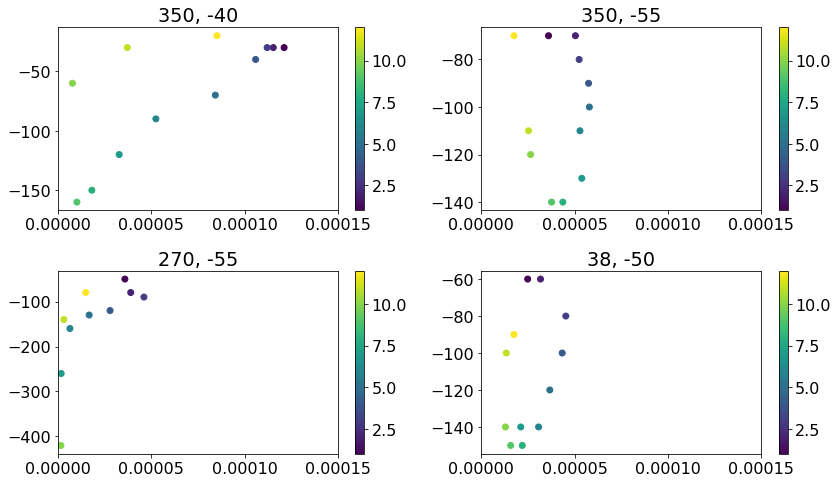

In [95]:
plt.figure(figsize=(12,7))

plt.subplot(221)
plt.scatter(N2_base.sel(LONGITUDE=350, LATITUDE=-40, method='nearest'), 
            -MLD_clim.sel(LONGITUDE=350, LATITUDE=-40, method='nearest'), 
           c = MLD_clim.month)
plt.xlim([0, 1.5e-4])
plt.colorbar()
plt.title('350, -40')

plt.subplot(222)
plt.scatter(N2_base.sel(LONGITUDE=350, LATITUDE=-55, method='nearest'), 
            -MLD_clim.sel(LONGITUDE=350, LATITUDE=-55, method='nearest'), 
           c = MLD_clim.month)
plt.xlim([0, 1.5e-4])
plt.colorbar()
plt.title('350, -55')

plt.subplot(223)
plt.scatter(N2_base.sel(LONGITUDE=270, LATITUDE=-55, method='nearest'), 
            -MLD_clim.sel(LONGITUDE=270, LATITUDE=-55, method='nearest'), 
           c = MLD_clim.month)
plt.xlim([0, 1.5e-4])
plt.colorbar()
plt.title('270, -55')
plt.tight_layout()

plt.subplot(224)
plt.scatter(N2_base.sel(LONGITUDE=38, LATITUDE=-50, method='nearest'), 
            -MLD_clim.sel(LONGITUDE=38, LATITUDE=-50, method='nearest'), 
           c = MLD_clim.month)
plt.xlim([0, 1.5e-4])
#plt.xlim([0, 1.5e-4])
plt.colorbar()
plt.title('38, -50')

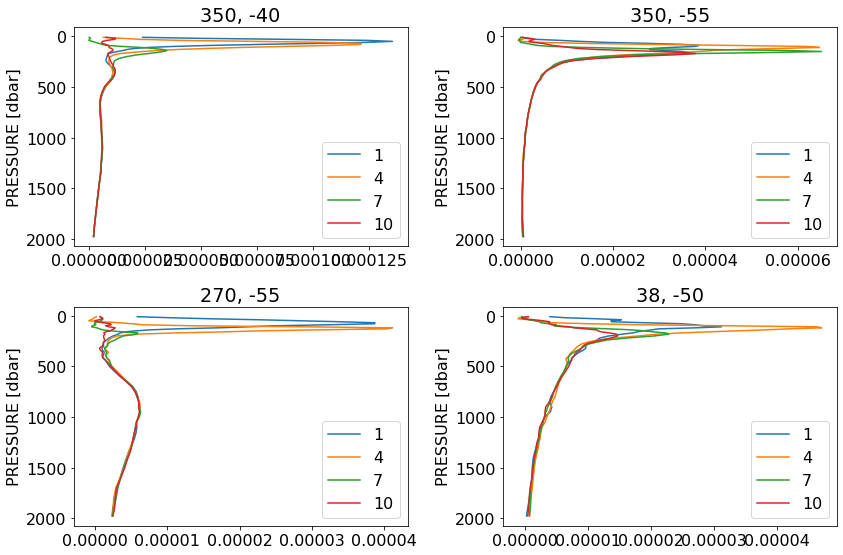

In [94]:
plt.figure(figsize=(12,8))

plt.subplot(221)
for i in range(0,12,3):
    N2_clim_monthly.sel(LONGITUDE=350, LATITUDE=-40, method='nearest').isel(month=i).plot(y='PRESSURE',
                                                                                         label=N2_clim_monthly.month.isel(month=i).values)
plt.gca().invert_yaxis()
plt.legend()
plt.title('350, -40')

plt.subplot(222)
for i in range(0,12,3):
    N2_clim_monthly.sel(LONGITUDE=350, LATITUDE=-55, method='nearest').isel(month=i).plot(y='PRESSURE',
                                                                                         label=N2_clim_monthly.month.isel(month=i).values)
plt.gca().invert_yaxis()
plt.legend()
plt.title('350, -55')

plt.subplot(223)
for i in range(0,12,3):
    N2_clim_monthly.sel(LONGITUDE=270, LATITUDE=-55, method='nearest').isel(month=i).plot(y='PRESSURE',
                                                                                         label=N2_clim_monthly.month.isel(month=i).values)
plt.gca().invert_yaxis()
plt.legend()
plt.title('270, -55')

plt.subplot(224)
for i in range(0,12,3):
    N2_clim_monthly.sel(LONGITUDE=38, LATITUDE=-50, method='nearest').isel(month=i).plot(y='PRESSURE',
                                                                                         label=N2_clim_monthly.month.isel(month=i).values)
plt.gca().invert_yaxis()
plt.legend()
plt.title('38, -50')

plt.tight_layout()

## Interpolate to isopycnals

https://github.com/earthcube2020/ec20_jones_etal/blob/master/xarrayutils_xlayers.ipynb

Use Julius' method since it is cheap, can use xlayers when doing properly.

In [258]:
from xarrayutils.vertical_coordinates import conservative_remap
from xarrayutils.vertical_coordinates import linear_interpolation_regrid

/Users/dhruvbalwada/code/miniconda/envs/sogos/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)


In [282]:
Pres_bounds = np.zeros(len(RG_SO.PRESSURE)+1)
Pres_bounds[0] = 0
Pres_bounds[1:-1]= np.array(0.5*(RG_SO.PRESSURE.values[0:-1] + RG_SO.PRESSURE.values[1:]))
Pres_bounds[-1] = 2000

# Define lev_bounds to be the cell edges in the vertical
RG_SO = RG_SO.assign_coords(PRESSURE_bounds = Pres_bounds, dims='Pres_bounds');

In [379]:
# Define the densities used in the new coordinate system
t_vals = np.arange(24, 28.1, 0.05)

In [295]:
# fill nans in the salinity with zeros
RG_SO['SPICE0'] = RG_SO['SPICE0'].fillna(-1000)

In [359]:
RG_SO['N2'] = N2_clim_monthly
RG_SO['N2'] = RG_SO['N2'].fillna(-1000)

In [362]:
# here, we define  a function that applies the xarrayutils package to the data
def apply_xarrayutils(ds, lev_new, var2remap='SPICE0', gridvar='SIGMA0', lev_old='PRESSURE', 
                      lev_bounds_old='PRESSURE_bounds', ):
    # define the new density grid
    density_values = xr.DataArray(lev_new, coords=[('t', lev_new)]) 

    # Find the depth of these surfaces 
    z_dens_bounds = linear_interpolation_regrid(ds.PRESSURE, 
                                                ds[gridvar], density_values, 
                                                z_bounds=ds[lev_bounds_old] ,
                                                target_value_dim='t', 
                                                z_bounds_dim=lev_bounds_old)

    # define the cell boundaries in the original salinity field
    bounds_original = ds[lev_bounds_old]

    # Remap salinity into density space
    ds_dens_cons = conservative_remap(ds[var2remap].squeeze(), bounds_original, z_dens_bounds.squeeze(),
                                   z_dim=lev_old, z_bnd_dim=lev_bounds_old, z_bnd_dim_target='regridded',
                                      mask=True
                                    ) # the associated depth dimensions for each array

    # replace the new depth dimension values with the appropriate depth 
    # (here the middle of the density cell bounds)
    lev_new = z_dens_bounds.coords['regridded'].data
    lev_new = 0.5 * (lev_new[1:] + lev_new[0:-1])

    ds_dens_cons.coords['remapped'] = xr.DataArray(lev_new, coords=[('remapped', lev_new)])
    return ds_dens_cons, z_dens_bounds

In [380]:
ds_dens_N2, z_dens_bounds = apply_xarrayutils(RG_SO, t_vals, var2remap='N2')

In [364]:
ds_dens_SPICE0, z_dens_bounds = apply_xarrayutils(RG_SO, t_vals, var2remap='SPICE0')

In [389]:
dz_remapped = z_dens_bounds.diff('regridded').rename({'regridded':'remapped'})
dz_remapped.coords['remapped'] = ds_dens_N2.coords['remapped'].values
N2_dens = ds_dens_N2.where(dz_remapped>0)

In [451]:
z_remapped = xr.DataArray(0.5*(z_dens_bounds[:,:,:,1:].values + z_dens_bounds[:,:,:,0:-1].values),
                          dims = dz_remapped.dims, coords = dz_remapped.coords)

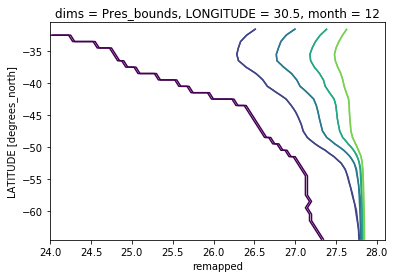

In [452]:
z_dens_bounds.sel(LONGITUDE=30, month=i, method='nearest').plot.contour()
z_remapped.sel(LONGITUDE=30, month=i, method='nearest').plot.contour()

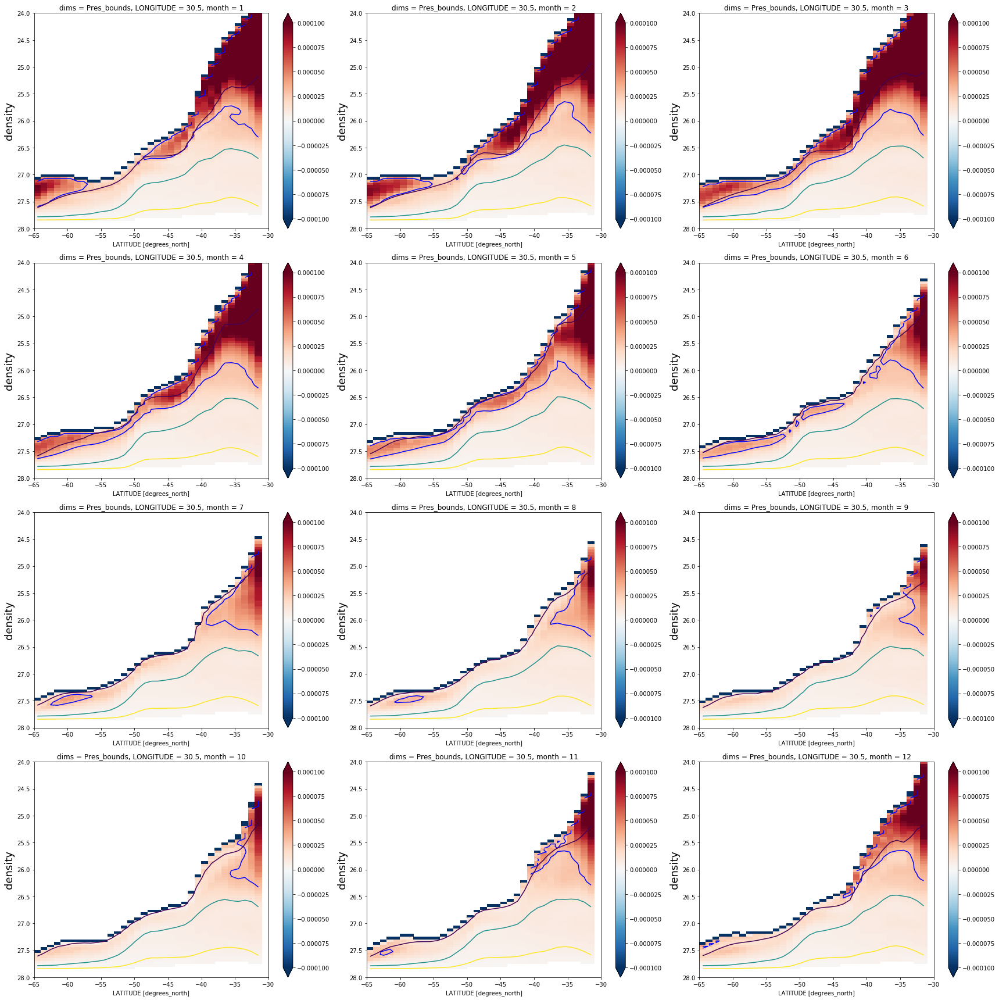

In [455]:



fig = plt.figure(figsize=(8*3,6*4))
fig.set_tight_layout(True)

lat = 30;

for i in range(1,13):
# plot N2 in density space
    ax = fig.add_subplot(4, 3, i)
    N2_dens.sel(LONGITUDE=30, month=i, method='nearest').plot(x='LATITUDE', y='remapped', 
                        ax=ax, vmin=-1e-4, vmax=1e-4, cmap='RdBu_r')
    N2_dens.sel(LONGITUDE=30, month=i, method='nearest').plot.contour(x='LATITUDE', y='remapped', 
                        ax=ax,levels=[3e-5], colors='b')
    z_remapped.sel(LONGITUDE=30, month=i, method='nearest').plot.contour(x='LATITUDE', y='remapped'
                                                                        , levels=[100, 500, 1500])
    ax.set_ylabel('latitude', fontsize=18)
    ax.set_ylabel('density', fontsize=18)
    ax.set_ylim(28, 24)
    ax.set_xlim(-65, -30);

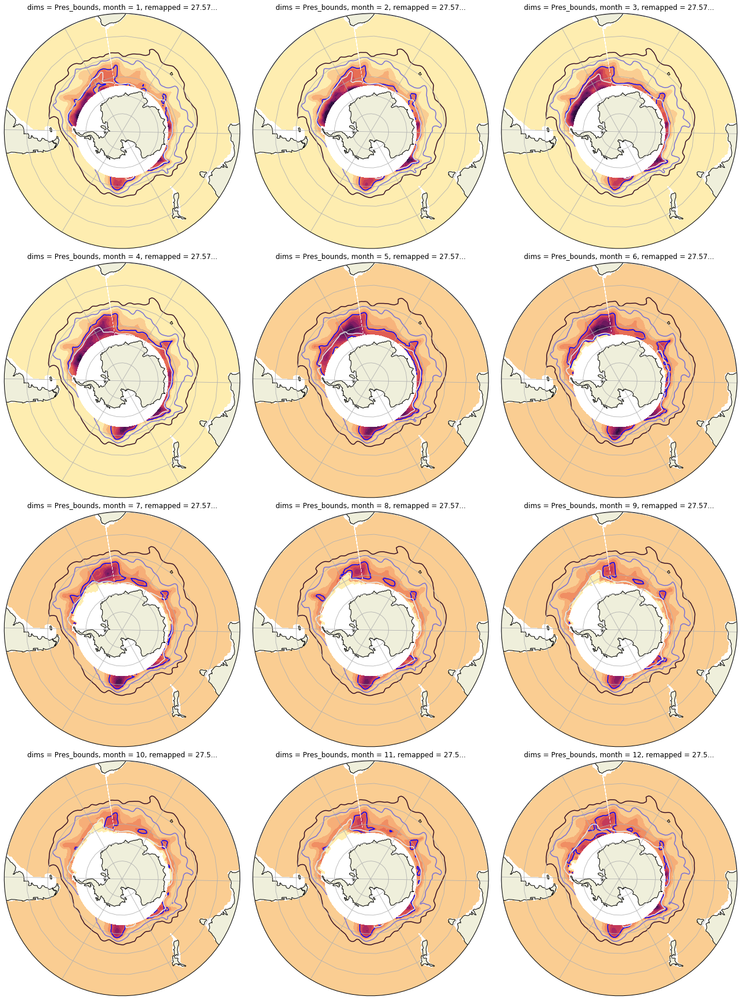

In [475]:
fig = plt.figure(figsize=(6*3,6*4))
fig.set_tight_layout(True)

dens=27.6

for i in range(1,13):
    ax = fig.add_subplot(4, 3, i, projection=ccrs.SouthPolarStereo(central_longitude=29))
   
    
    # make a circular boundary (otherwise on a square)
    theta = np.linspace(0, 2 * np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)

    # Some decoration
    ax.add_feature(cfeature.LAND)
    ax.coastlines()
    # ax.add_feature(cfeature.OCEAN)
    ax.gridlines()


    N2_dens.sel(remapped=dens, month=i, method='nearest').plot.contourf(
                levels=np.linspace(5e-7, 1e-4,12), 
                    ax=ax, transform=ccrs.PlateCarree(), add_colorbar=False, #cbar_kwargs={"shrink": 0.3},
                                    cmap=cm.matter)
    
    N2_dens.sel(remapped=dens,month=i, method='nearest').plot.contour(levels=[3e-5], 
                    ax=ax, transform=ccrs.PlateCarree(), add_colorbar=False, 
                                    colors='b')
    
    #RG_SO.SIGMA0.sel(month=i, PRESSURE=0, method='nearest').plot.contour(
    #    levels=np.linspace(23.4,27.6,6), vmin=23.4, vmax=27.6,
    #    ax=ax, transform=ccrs.PlateCarree(), cmap=cm.dense)
    z_remapped.sel(month=i, remapped=dens, method='nearest').plot.contour(
                    levels=[100,500,1000],
                    ax=ax, transform=ccrs.PlateCarree(), add_colorbar=False,  cmap=cm.dense)
    
    
    ax.set_extent([-180, 180, -90, -30], crs = ccrs.PlateCarree())
    
plt.savefig('../figures/N2_' + str(dens) +'.pdf')


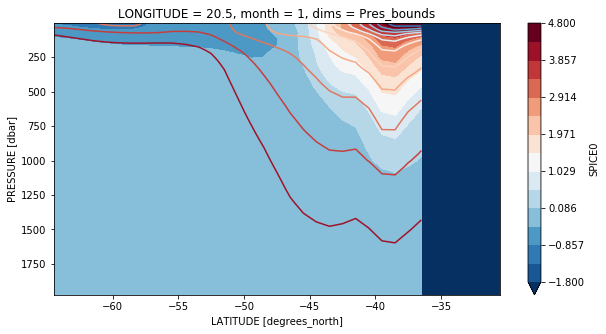

In [333]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
RG_slice.SPICE0.plot.contourf(x='LATITUDE', y='PRESSURE', ax=ax, 
                     levels=np.linspace(-1.8,4.8,15),
                    vmin=-5, vmax=5, cmap='RdBu_r')
RG_slice.SIGMA0.plot.contour(x='LATITUDE', y='PRESSURE', ax=ax, 
                     levels=t_vals[0:-1:3],
                    vmin=-5, vmax=5, cmap='RdBu_r')
ax.invert_yaxis()

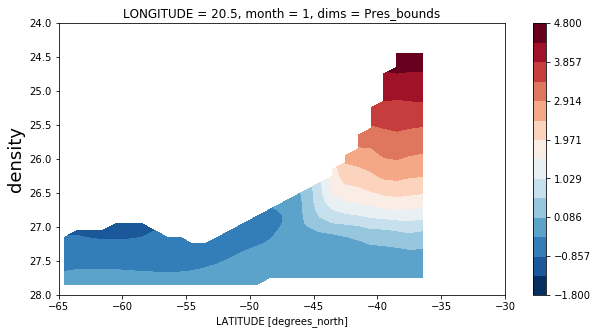

In [334]:
sal_dens = ds_dens_cons.where(dz_remapped>0)

# plot salinity in density space
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
sal_dens.plot.contourf(x='LATITUDE', y='remapped', 
                    ax=ax, levels=np.linspace(-1.8,4.8,15),vmin=-5, vmax=5, cmap='RdBu_r')
#ax.set_title('Salinity \n Jan 2100, SSP1-2.6', fontsize=18)
ax.set_ylabel('latitude', fontsize=18)
ax.set_ylabel('density', fontsize=18)
ax.set_ylim(28, 24)
ax.set_xlim(-65, -30);